Из репозитория [dreambooth](https://github.com/google/dreambooth/tree/main/dataset) Выбрать набор изображений с определённым концептом для дообучения Stable Diffusion. Также можно использовать свои изображения.
Пример изображений:
![](https://drive.usercontent.google.com/download?id=14g0lO1Rr7aCzX-TSVxig8qtNMyWEVK0b&export=view&authuser=0)

Дообучить Stable Diffuion генерировать выбранный концепт в новых контекстах. Для примера можно использовать следующие реализации:
*   [Ноутбук](https://colab.research.google.com/drive/1k6DZchKnWZpK9OtgcIpBWPU3j1mdrKa8?usp=sharing) Finetuning_Stable_Diffusion.ipynb
*   [Пример](https://github.com/huggingface/diffusers/blob/main/examples/dreambooth/train_dreambooth.py) из библиотеки diffusers

В качестве результатов необходимо показать генерации дообученной модели в новых контекстах.
Например:
![](https://drive.google.com/uc?export=view&id=1w9sy_la9TT46LwnKwOtJRmTlpJkvsF8k)

# Решение: DreamBooth + LoRA для Stable Diffusion 1.5

**Концепт:** щенок корги `dog6` из [набора DreamBooth](https://github.com/google/dreambooth/tree/main/dataset) (5 фотографий на однотонном оранжевом/жёлтом фоне).

**План:**
1. Разобрать pipeline латентной диффузионной модели: из каких компонент состоит Stable Diffusion и как из шума получается изображение (ручной цикл денойзинга).
2. Посмотреть, что базовая модель генерирует по запросу с редким токеном `sks` — она ничего не знает о нашем щенке.
3. Сгенерировать изображения класса «dog» базовой моделью (для prior preservation loss).
4. Дообучить UNet методом **DreamBooth** с **LoRA**-адаптерами: связать редкий токен `sks` с конкретной собакой.
5. Показать генерации дообученной модели в новых контекстах, сравнить с базовой моделью на тех же seed'ах, выполнить text-guided изменение исходной фотографии (img2img), посчитать CLIP-метрики.

## 0. Импорты и настройки

In [1]:
import os, gc, math, random, time, urllib.request
from pathlib import Path

import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

from diffusers import (AutoencoderKL, UNet2DConditionModel, DDPMScheduler,
                       DPMSolverMultistepScheduler, StableDiffusionPipeline,
                       StableDiffusionImg2ImgPipeline)
from transformers import CLIPTextModel, CLIPTokenizer, CLIPModel, CLIPProcessor
from peft import LoraConfig
from peft.utils import get_peft_model_state_dict

import diffusers, transformers, peft
print('torch', torch.__version__, '| diffusers', diffusers.__version__,
      '| transformers', transformers.__version__, '| peft', peft.__version__)

device = 'cuda'
assert torch.cuda.is_available()
print(torch.cuda.get_device_name(0))

SEED = 42
def seed_everything(seed=SEED):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
seed_everything()

MODEL_ID = 'stable-diffusion-v1-5/stable-diffusion-v1-5'
DATA_DIR = Path('data')
INSTANCE_DIR = DATA_DIR / 'dog6'          # фото нашего концепта
CLASS_DIR = DATA_DIR / 'class_dog'        # сгенерированные изображения класса
OUTPUT_DIR = Path('outputs/dreambooth_lora_dog6')
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

UNIQUE_TOKEN, CLASS_TOKEN = 'sks', 'dog'
INSTANCE_PROMPT = f'a photo of {UNIQUE_TOKEN} {CLASS_TOKEN}'
CLASS_PROMPT = f'a photo of {CLASS_TOKEN}'
RESOLUTION = 512

torch 2.7.0+cu126 | diffusers 0.35.1 | transformers 4.56.2 | peft 0.17.1
NVIDIA GeForce RTX 3090


## 1. Данные

Скачиваем 5 фотографий `dog6` из репозитория DreamBooth (если их ещё нет локально).

In [2]:
INSTANCE_DIR.mkdir(parents=True, exist_ok=True)
base_url = 'https://raw.githubusercontent.com/google/dreambooth/main/dataset/dog6/{:02d}.jpg'
for i in range(5):
    path = INSTANCE_DIR / f'{i:02d}.jpg'
    if not path.exists():
        urllib.request.urlretrieve(base_url.format(i), path)

instance_paths = sorted(INSTANCE_DIR.glob('*.jpg'))
instance_images = [Image.open(p).convert('RGB') for p in instance_paths]
print(len(instance_images), 'images,', 'sizes:', {im.size for im in instance_images})

def show_images(images, titles=None, ncols=5, size=3.2, suptitle=None):
    nrows = math.ceil(len(images) / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(size * ncols, size * nrows + (0.4 if suptitle else 0)))
    axes = np.array(axes).reshape(-1)
    for ax in axes: ax.axis('off')
    for i, im in enumerate(images):
        axes[i].imshow(im)
        if titles: axes[i].set_title(titles[i], fontsize=9, wrap=True)
    if suptitle: fig.suptitle(suptitle, fontsize=13)
    plt.tight_layout(); plt.show()

show_images(instance_images, [p.name for p in instance_paths], suptitle='Обучающие изображения концепта (dog6)')

5 images, sizes: {(1282, 1282), (1301, 1301), (1272, 1272), (1278, 1278)}


<Figure size 1600x360 with 5 Axes>

## 2. Pipeline латентной диффузионной модели

Stable Diffusion — это **латентная** диффузионная модель. Она состоит из четырёх компонент:

| Компонента | Класс | Роль |
|---|---|---|
| Токенизатор + текстовый энкодер | `CLIPTokenizer`, `CLIPTextModel` (ViT-L/14) | текст → 77×768 эмбеддингов, по которым обусловливается генерация |
| VAE | `AutoencoderKL` | изображение 512×512×3 ↔ латент 64×64×4 (сжатие в 48 раз); диффузия идёт в латентном пространстве |
| UNet | `UNet2DConditionModel` (~860M параметров) | по зашумлённому латенту $z_t$, шагу $t$ и тексту $c$ предсказывает шум $\varepsilon_\theta(z_t, t, c)$; текст подмешивается через cross-attention |
| Scheduler | `DDPMScheduler`, `DPMSolverMultistepScheduler`, ... | задаёт расписание шума $\bar\alpha_t$ и правило перехода $z_t \to z_{t-1}$ |

**Прямой процесс** (используется при обучении): $z_t = \sqrt{\bar\alpha_t}\, z_0 + \sqrt{1-\bar\alpha_t}\,\varepsilon$, $\varepsilon \sim \mathcal N(0, I)$.
**Функция потерь:** $\mathcal L = \mathbb E_{z_0, \varepsilon, t}\, \lVert \varepsilon - \varepsilon_\theta(z_t, t, c)\rVert^2$.

**Обратный процесс** (генерация): стартуем с $z_T \sim \mathcal N(0, I)$ и шаг за шагом убираем шум. Для усиления влияния текста используется **classifier-free guidance**:
$\hat\varepsilon = \varepsilon_\theta(z_t, t, \varnothing) + w\,(\varepsilon_\theta(z_t, t, c) - \varepsilon_\theta(z_t, t, \varnothing))$.
Готовый латент $z_0$ декодируется VAE в картинку.

Соберём этот цикл вручную из компонент и посмотрим, как на разных шагах выглядит текущая оценка чистого изображения $\hat z_0 = (z_t - \sqrt{1-\bar\alpha_t}\,\hat\varepsilon)/\sqrt{\bar\alpha_t}$.

In [3]:
# Базовая модель в fp16 для инференса (safety checker не нужен)
pipe = StableDiffusionPipeline.from_pretrained(MODEL_ID, torch_dtype=torch.float16, variant='fp16',
                                               safety_checker=None, requires_safety_checker=False).to(device)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe.set_progress_bar_config(disable=True)

for name in ['text_encoder', 'vae', 'unet']:
    m = getattr(pipe, name)
    print(f'{name:13s} {type(m).__name__:22s} {sum(p.numel() for p in m.parameters())/1e6:7.1f}M params')
print('scheduler    ', type(pipe.scheduler).__name__)
print('VAE scaling factor:', pipe.vae.config.scaling_factor)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


text_encoder  CLIPTextModel            123.1M params
vae           AutoencoderKL             83.7M params
unet          UNet2DConditionModel     859.5M params
scheduler     DPMSolverMultistepScheduler
VAE scaling factor: 0.18215


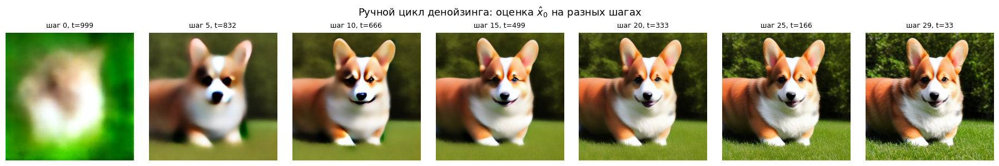

In [4]:
@torch.no_grad()
def encode_prompt(prompt, negative=''):
    ids = pipe.tokenizer([negative, prompt], padding='max_length', max_length=pipe.tokenizer.model_max_length,
                         truncation=True, return_tensors='pt').input_ids.to(device)
    return pipe.text_encoder(ids)[0]                       # [2, 77, 768]: (unconditional, conditional)

@torch.no_grad()
def decode_latents(z):
    img = pipe.vae.decode(z / pipe.vae.config.scaling_factor).sample
    img = (img / 2 + 0.5).clamp(0, 1)
    return [Image.fromarray((x.permute(1, 2, 0).float().cpu().numpy() * 255).astype(np.uint8)) for x in img]

@torch.no_grad()
def manual_sampling(prompt, steps=30, guidance=7.5, seed=0, snapshot_every=5):
    sched = DDPMScheduler.from_config(pipe.scheduler.config)       # для формулы x0 нужен alphas_cumprod
    dpm = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
    dpm.set_timesteps(steps, device=device)
    emb = encode_prompt(prompt)
    g = torch.Generator(device).manual_seed(seed)
    z = torch.randn((1, 4, RESOLUTION // 8, RESOLUTION // 8), generator=g, device=device, dtype=torch.float16)
    z = z * dpm.init_noise_sigma
    snaps = []
    for i, t in enumerate(dpm.timesteps):
        eps_u, eps_c = pipe.unet(torch.cat([z] * 2), t, encoder_hidden_states=emb).sample.chunk(2)
        eps = eps_u + guidance * (eps_c - eps_u)                   # classifier-free guidance
        if i % snapshot_every == 0 or i == steps - 1:
            a = sched.alphas_cumprod[t.item()].to(device)
            x0 = (z - (1 - a).sqrt() * eps) / a.sqrt()             # текущая оценка чистого латента
            snaps.append((i, t.item(), x0))
        z = dpm.step(eps, t, z).prev_sample
    return snaps, z

snaps, z_final = manual_sampling('a photo of a corgi puppy sitting on the grass, highly detailed', seed=1)
imgs = decode_latents(torch.cat([s[2] for s in snaps]))
show_images(imgs, [f'шаг {i}, t={t}' for i, t, _ in snaps], ncols=len(imgs), size=2.6,
            suptitle='Ручной цикл денойзинга: оценка $\\hat x_0$ на разных шагах')

На первых шагах (большой $t$) модель видит почти чистый шум, и оценка $\hat x_0$ — размытое «среднее» изображение, в котором угадывается только композиция. По мере уменьшения шума проявляются форма, затем детали и текстура. Это и есть coarse-to-fine характер диффузии.

Кроме самого латента полезно увидеть, как выглядит латентное пространство VAE: 4 канала 64×64 — это сильно сжатое, но всё ещё «пространственное» представление изображения.

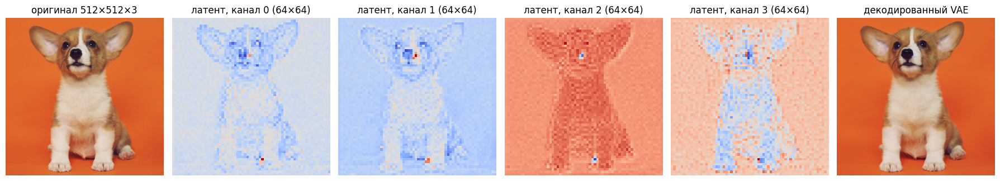

In [5]:
with torch.no_grad():
    x = transforms.Compose([transforms.Resize(RESOLUTION), transforms.CenterCrop(RESOLUTION), transforms.ToTensor(),
                            transforms.Normalize([0.5], [0.5])])(instance_images[1])[None].to(device, torch.float16)
    lat = pipe.vae.encode(x).latent_dist.mean * pipe.vae.config.scaling_factor
    rec = decode_latents(lat)[0]

fig, axes = plt.subplots(1, 6, figsize=(18, 3.2))
axes[0].imshow(instance_images[1].resize((RESOLUTION, RESOLUTION))); axes[0].set_title('оригинал 512×512×3')
for c in range(4):
    axes[c + 1].imshow(lat[0, c].float().cpu(), cmap='coolwarm'); axes[c + 1].set_title(f'латент, канал {c} (64×64)')
axes[5].imshow(rec); axes[5].set_title('декодированный VAE')
for ax in axes: ax.axis('off')
plt.tight_layout(); plt.show()

## 3. Что знает базовая модель о `sks dog`?

Токен `sks` — редкий, у него почти нет устойчивой семантики в CLIP. Базовая модель на запрос `a photo of sks dog ...` рисует какую-то случайную собаку, не нашего щенка. Эти же seed'ы используем после дообучения для честного сравнения.

24 images in 28s


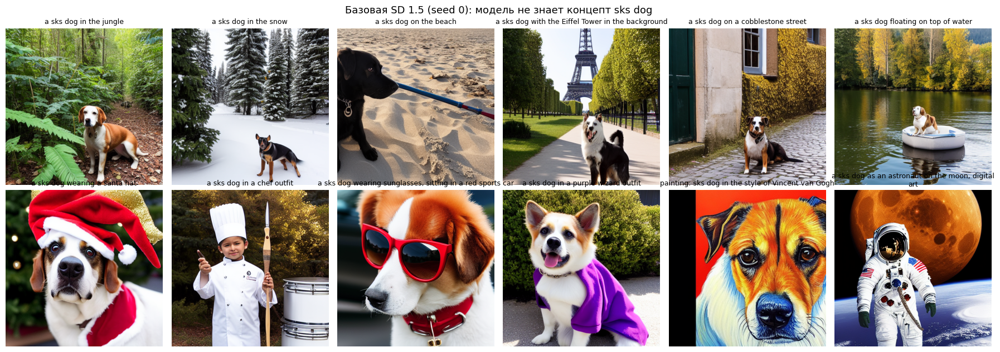

In [6]:
EVAL_PROMPTS = [
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} in the jungle',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} in the snow',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} on the beach',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} with the Eiffel Tower in the background',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} on a cobblestone street',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} floating on top of water',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} wearing a santa hat',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} in a chef outfit',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} wearing sunglasses, sitting in a red sports car',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} in a purple wizard outfit',
    f'a painting of a {UNIQUE_TOKEN} {CLASS_TOKEN} in the style of Vincent van Gogh',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} as an astronaut on the moon, digital art',
]
NEGATIVE = 'blurry, low quality, deformed, disfigured, extra legs, cartoon, watermark, text'
EVAL_SEEDS = [0, 1]

@torch.no_grad()
def generate(prompts, seeds, steps=30, guidance=7.5, batch=6):
    jobs = [(p, s) for s in seeds for p in prompts]
    out = []
    for k in range(0, len(jobs), batch):
        chunk = jobs[k:k + batch]
        gens = [torch.Generator(device).manual_seed(s) for _, s in chunk]
        out += pipe([p for p, _ in chunk], negative_prompt=[NEGATIVE] * len(chunk), num_inference_steps=steps,
                    guidance_scale=guidance, generator=gens).images
    return out, jobs

def short(p):
    return p.replace(f'{UNIQUE_TOKEN} {CLASS_TOKEN}', 'sks dog').replace('a painting of a ', 'painting: ')

t0 = time.time()
base_images, jobs = generate(EVAL_PROMPTS, EVAL_SEEDS)
print(f'{len(base_images)} images in {time.time()-t0:.0f}s')
show_images(base_images[:len(EVAL_PROMPTS)], [short(p) for p, _ in jobs[:len(EVAL_PROMPTS)]], ncols=6, size=3,
            suptitle='Базовая SD 1.5 (seed 0): модель не знает концепт sks dog')

## 4. Изображения класса для prior preservation

При дообучении на 5 фотографиях возникают две проблемы:
- **language drift** — модель «забывает», как выглядит произвольная собака, и слово `dog` начинает означать только нашего корги;
- **переобучение** — снижается разнообразие поз и контекстов.

DreamBooth решает это **prior preservation loss**: параллельно с фотографиями концепта модель учится на изображениях класса, сгенерированных *ею же* до дообучения по запросу `a photo of dog`:

$$\mathcal L = \mathbb E\,\lVert \varepsilon - \varepsilon_\theta(z_t, t, c_{\text{sks dog}})\rVert^2 + \lambda\,\mathbb E\,\lVert \varepsilon' - \varepsilon_\theta(z'_t, t', c_{\text{dog}})\rVert^2.$$

Генерируем 200 изображений класса (кешируются на диск).

200 class images


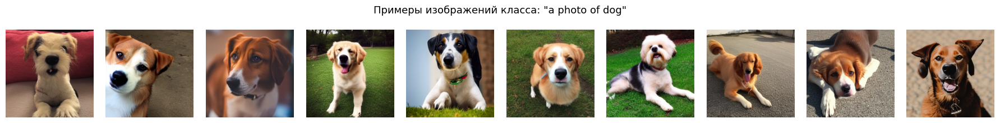

In [7]:
NUM_CLASS_IMAGES = 200
CLASS_DIR.mkdir(parents=True, exist_ok=True)
existing = len(list(CLASS_DIR.glob('*.jpg')))
if existing < NUM_CLASS_IMAGES:
    t0 = time.time()
    for k in tqdm(range(existing, NUM_CLASS_IMAGES, 8), desc='class images'):
        n = min(8, NUM_CLASS_IMAGES - k)
        g = [torch.Generator(device).manual_seed(10_000 + k + j) for j in range(n)]
        ims = pipe([CLASS_PROMPT] * n, num_inference_steps=25, guidance_scale=7.5, generator=g).images
        for j, im in enumerate(ims):
            im.save(CLASS_DIR / f'{k + j:04d}.jpg', quality=95)
    print(f'generated in {time.time()-t0:.0f}s')

class_paths = sorted(CLASS_DIR.glob('*.jpg'))[:NUM_CLASS_IMAGES]
print(len(class_paths), 'class images')
show_images([Image.open(p) for p in class_paths[:10]], ncols=10, size=1.8, suptitle=f'Примеры изображений класса: "{CLASS_PROMPT}"')

In [8]:
# освобождаем fp16-пайплайн: для обучения загрузим компоненты отдельно
del pipe; gc.collect(); torch.cuda.empty_cache()

## 5. Дообучение: DreamBooth + LoRA

Вместо обновления всех ~860M весов UNet используем **LoRA** (Low-Rank Adaptation): к линейным/1×1-свёрточным слоям attention- и feed-forward-блоков добавляются низкоранговые поправки $W' = W + \frac{\alpha}{r} BA$, $A\in\mathbb R^{r\times d_{in}}$, $B\in\mathbb R^{d_{out}\times r}$, $B$ инициализируется нулями (в начале обучения модель совпадает с базовой). Обучаются только $A, B$.

Плюсы: в десятки раз меньше обучаемых параметров и памяти под оптимизатор, быстрое обучение, итоговые веса занимают десятки МБ, адаптер можно включать/выключать на лету — удобно для сравнения с базовой моделью.

**Настройки:**
- текстовый энкодер и VAE заморожены; обучаются только LoRA-адаптеры UNet (rank 32);
- батч = 1 фото концепта + 1 изображение класса, $\lambda = 1$;
- 1000 шагов, AdamW, lr = 1e-4, warmup 50 шагов;
- аугментации: случайный кроп и горизонтальное отражение;
- веса UNet в fp32, прямой проход в bf16 (autocast) + gradient checkpointing.

In [9]:
tokenizer = CLIPTokenizer.from_pretrained(MODEL_ID, subfolder='tokenizer')
text_encoder = CLIPTextModel.from_pretrained(MODEL_ID, subfolder='text_encoder', variant='fp16',
                                             torch_dtype=torch.float16).to(device).eval()
vae = AutoencoderKL.from_pretrained(MODEL_ID, subfolder='vae', variant='fp16', torch_dtype=torch.float32).to(device).eval()
unet = UNet2DConditionModel.from_pretrained(MODEL_ID, subfolder='unet', variant='fp16', torch_dtype=torch.float32).to(device)
noise_scheduler = DDPMScheduler.from_pretrained(MODEL_ID, subfolder='scheduler')
for m in (text_encoder, vae, unet):
    m.requires_grad_(False)

LORA_RANK = 32
lora_config = LoraConfig(r=LORA_RANK, lora_alpha=LORA_RANK, init_lora_weights='gaussian',
                         target_modules=['to_q', 'to_k', 'to_v', 'to_out.0', 'proj_in', 'proj_out',
                                         'ff.net.0.proj', 'ff.net.2'])
unet.add_adapter(lora_config)
unet.enable_gradient_checkpointing()

lora_params = [p for p in unet.parameters() if p.requires_grad]
n_train, n_total = sum(p.numel() for p in lora_params), sum(p.numel() for p in unet.parameters())
print(f'trainable LoRA params: {n_train/1e6:.2f}M из {n_total/1e6:.1f}M ({100*n_train/n_total:.2f}%)')

trainable LoRA params: 13.57M из 873.1M (1.55%)


torch.Size([2, 3, 512, 512]) torch.Size([2, 77])


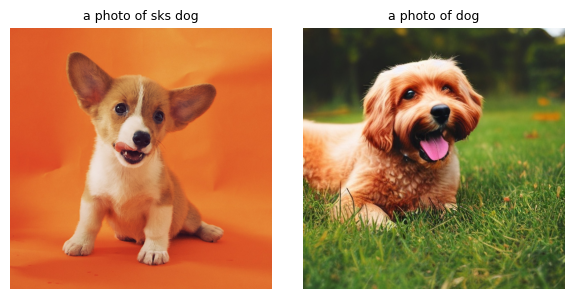

In [10]:
class DreamBoothDataset(Dataset):
    # На каждом шаге: одно фото концепта + одно изображение класса со своими промптами
    def __init__(self, instance_paths, class_paths, size=RESOLUTION, length=10_000):
        self.instance = [Image.open(p).convert('RGB') for p in instance_paths]
        self.class_paths = class_paths
        self.length = length
        self.aug = transforms.Compose([
            transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.RandomCrop(size),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ])
        ids = lambda p: tokenizer(p, padding='max_length', max_length=tokenizer.model_max_length,
                                  truncation=True, return_tensors='pt').input_ids[0]
        self.instance_ids, self.class_ids = ids(INSTANCE_PROMPT), ids(CLASS_PROMPT)

    def __len__(self):
        return self.length

    def __getitem__(self, i):
        inst = self.instance[i % len(self.instance)]
        cls = Image.open(self.class_paths[random.randrange(len(self.class_paths))]).convert('RGB')
        return {'pixels': torch.stack([self.aug(inst), self.aug(cls)]),
                'ids': torch.stack([self.instance_ids, self.class_ids])}

def collate(batch):
    # [B,2,...] -> [2B,...]: сначала все instance, потом все class
    pixels = torch.stack([b['pixels'] for b in batch]).transpose(0, 1).reshape(-1, 3, RESOLUTION, RESOLUTION)
    ids = torch.stack([b['ids'] for b in batch]).transpose(0, 1).reshape(-1, tokenizer.model_max_length)
    return pixels, ids

dataset = DreamBoothDataset(instance_paths, class_paths)
loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=collate, num_workers=2)
px, ids = next(iter(loader))
print(px.shape, ids.shape)
show_images([(x.permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1).numpy() for x in px],
            [INSTANCE_PROMPT, CLASS_PROMPT], ncols=2, size=3)

In [11]:
MAX_STEPS = 1000
LR = 1e-4
WARMUP = 50
PRIOR_WEIGHT = 1.0

optimizer = torch.optim.AdamW(lora_params, lr=LR, weight_decay=1e-2)
lr_sched = torch.optim.lr_scheduler.LambdaLR(optimizer, lambda s: min(1.0, (s + 1) / WARMUP))

seed_everything()
unet.train()
history = {'instance': [], 'prior': []}
step, t0 = 0, time.time()
pbar = tqdm(total=MAX_STEPS, desc='train')
while step < MAX_STEPS:
    for pixels, ids in loader:
        pixels, ids = pixels.to(device), ids.to(device)
        with torch.no_grad():
            latents = vae.encode(pixels).latent_dist.sample() * vae.config.scaling_factor
            enc = text_encoder(ids)[0].float()
        noise = torch.randn_like(latents)
        t = torch.randint(0, noise_scheduler.config.num_train_timesteps, (latents.shape[0],), device=device)
        noisy = noise_scheduler.add_noise(latents, noise, t)

        with torch.autocast('cuda', dtype=torch.bfloat16):
            pred = unet(noisy, t, encoder_hidden_states=enc).sample
        pred_inst, pred_prior = pred.float().chunk(2)
        noise_inst, noise_prior = noise.chunk(2)
        loss_inst = F.mse_loss(pred_inst, noise_inst)
        loss_prior = F.mse_loss(pred_prior, noise_prior)
        loss = loss_inst + PRIOR_WEIGHT * loss_prior

        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(lora_params, 1.0)
        optimizer.step(); lr_sched.step()

        history['instance'].append(loss_inst.item()); history['prior'].append(loss_prior.item())
        step += 1
        pbar.update(1)
        if step % 50 == 0:
            pbar.set_postfix(inst=np.mean(history['instance'][-50:]), prior=np.mean(history['prior'][-50:]))
        if step >= MAX_STEPS:
            break
pbar.close()
print(f'training: {(time.time()-t0)/60:.1f} min, peak GPU memory {torch.cuda.max_memory_allocated()/2**30:.1f} GB')

train:   0%|          | 0/1000 [00:00<?, ?it/s]

training: 5.5 min, peak GPU memory 6.2 GB


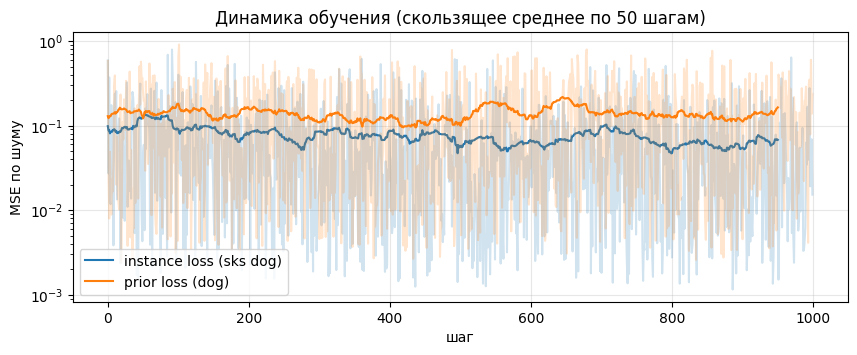

In [12]:
def smooth(x, k=50):
    return np.convolve(x, np.ones(k) / k, mode='valid')

plt.figure(figsize=(10, 3.5))
plt.plot(history['instance'], alpha=0.2, color='C0'); plt.plot(smooth(history['instance']), color='C0', label='instance loss (sks dog)')
plt.plot(history['prior'], alpha=0.2, color='C1'); plt.plot(smooth(history['prior']), color='C1', label='prior loss (dog)')
plt.yscale('log'); plt.xlabel('шаг'); plt.ylabel('MSE по шуму'); plt.legend(); plt.grid(alpha=0.3)
plt.title('Динамика обучения (скользящее среднее по 50 шагам)'); plt.show()

Лосс диффузионной модели сильно шумит: на каждом шаге случайно выбирается $t$, а ошибка предсказания шума сильно зависит от уровня зашумления (при малых $t$ шум почти не отличим от деталей изображения — ошибка большая, при больших $t$ — маленькая). Поэтому смотрим на скользящее среднее: instance loss постепенно снижается (модель запоминает концепт), а prior loss остаётся на исходном уровне — знания о классе «собака» не разрушаются.

Сохраняем LoRA-веса в формате diffusers.

In [13]:
# сохраняем в PEFT-формате (lora_A / lora_B), который diffusers загружает напрямую
unet_lora_state = get_peft_model_state_dict(unet)
StableDiffusionPipeline.save_lora_weights(OUTPUT_DIR, unet_lora_layers=unet_lora_state, safe_serialization=True)
for f in OUTPUT_DIR.iterdir():
    print(f, f'{f.stat().st_size/2**20:.1f} MB')

del unet, vae, text_encoder, optimizer, lora_params, unet_lora_state
gc.collect(); torch.cuda.empty_cache()

outputs/dreambooth_lora_dog6/pytorch_lora_weights.safetensors 51.8 MB


## 6. Результаты: генерации дообученной модели в новых контекстах

Загружаем свежий fp16-пайплайн и подключаем сохранённый LoRA-адаптер.

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


UNet modules with loaded LoRA: 192


24 images in 33s


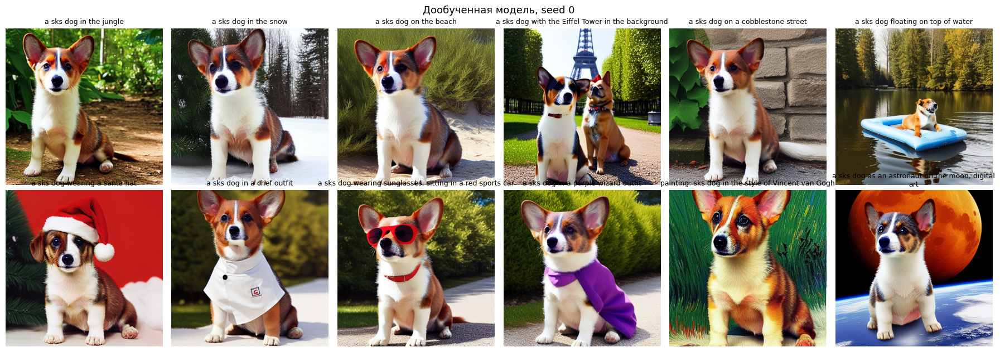

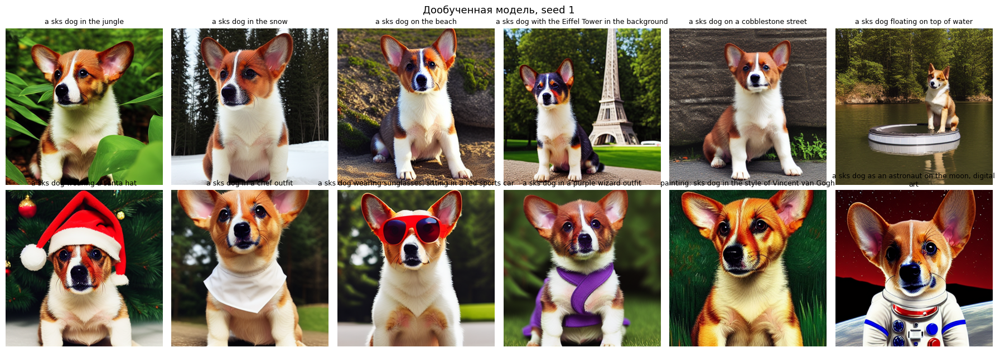

In [14]:
pipe = StableDiffusionPipeline.from_pretrained(MODEL_ID, torch_dtype=torch.float16, variant='fp16',
                                               safety_checker=None, requires_safety_checker=False).to(device)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe.set_progress_bar_config(disable=True)
pipe.load_lora_weights(OUTPUT_DIR, adapter_name='dog6')
n_lora = sum(1 for _, m in pipe.unet.named_modules() if hasattr(m, 'lora_A') and 'dog6' in m.lora_A)
print('UNet modules with loaded LoRA:', n_lora)

t0 = time.time()
ft_images, jobs = generate(EVAL_PROMPTS, EVAL_SEEDS)
print(f'{len(ft_images)} images in {time.time()-t0:.0f}s')
n = len(EVAL_PROMPTS)
show_images(ft_images[:n], [short(p) for p, _ in jobs[:n]], ncols=6, size=3, suptitle='Дообученная модель, seed 0')
show_images(ft_images[n:], [short(p) for p, _ in jobs[n:]], ncols=6, size=3, suptitle='Дообученная модель, seed 1')

### 6.1 Сравнение «до / после» на одинаковых seed'ах

Верхний ряд каждой пары — базовая модель, нижний — с LoRA. Начальный шум и промпт одинаковые, отличается только UNet.

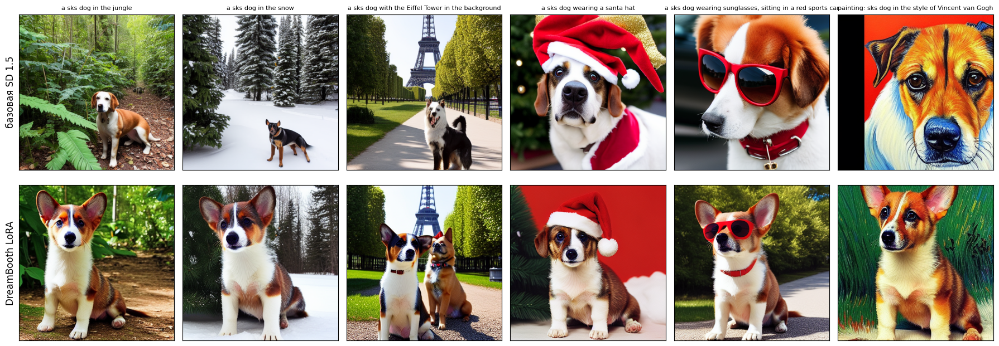

In [15]:
idx = [0, 1, 3, 6, 8, 10]
fig, axes = plt.subplots(2, len(idx), figsize=(3 * len(idx), 6.6))
for j, i in enumerate(idx):
    axes[0, j].imshow(base_images[i]); axes[0, j].set_title(short(EVAL_PROMPTS[i]), fontsize=8, wrap=True)
    axes[1, j].imshow(ft_images[i])
    for a in axes[:, j]: a.set_xticks([]); a.set_yticks([])
axes[0, 0].set_ylabel('базовая SD 1.5', fontsize=12); axes[1, 0].set_ylabel('DreamBooth LoRA', fontsize=12)
plt.tight_layout(); plt.show()

### 6.2 Проверка prior preservation: запрос без токена `sks`

Если бы модель переобучилась (language drift), то на запрос «a dog ...» она рисовала бы только нашего корги. Сравним базовую и дообученную модель по запросам без уникального токена.

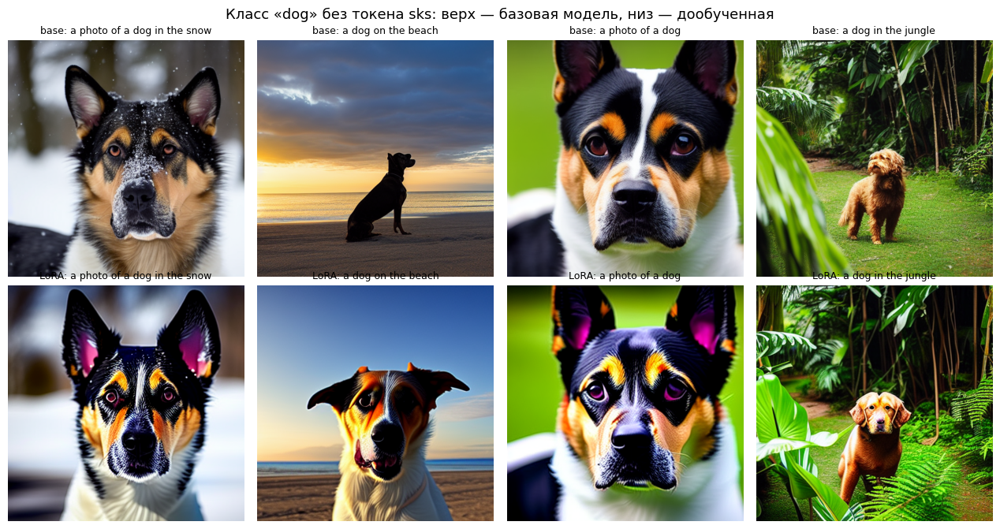

In [16]:
prior_prompts = ['a photo of a dog in the snow', 'a dog on the beach', 'a photo of a dog', 'a dog in the jungle']
pipe.disable_lora()
prior_base, _ = generate(prior_prompts, [3])
pipe.enable_lora()
prior_ft, _ = generate(prior_prompts, [3])
show_images(prior_base + prior_ft, [f'base: {p}' for p in prior_prompts] + [f'LoRA: {p}' for p in prior_prompts],
            ncols=4, size=3.2, suptitle='Класс «dog» без токена sks: верх — базовая модель, низ — дообученная')

### 6.3 Изменение изображения по тексту (img2img)

Дообученную модель можно использовать и для редактирования готового изображения. Исходная картинка кодируется VAE, латент зашумляется до уровня `strength` (доля пройденного прямого процесса) и затем денойзится уже с *новым* текстом. Чем больше `strength`, тем сильнее изменения и тем меньше сохраняется исходная композиция. LoRA при этом отвечает за то, чтобы внешность щенка сохранялась.

В качестве исходного берём изображение, сгенерированное дообученной моделью («sks dog in the jungle», seed 0), и меняем по тексту обстановку, стиль и аксессуары. При `strength=0.85` поза и композиция в основном сохраняются, а изменения получаются умеренными: снег, песок, аксессуары, акварельная стилизация. Более сильные правки (например, смена времени суток) требуют большего `strength` ценой потери исходной композиции.

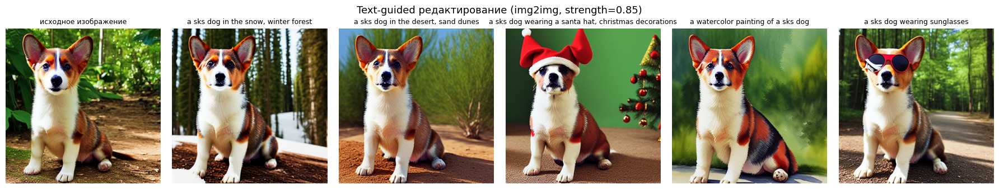

In [17]:
img2img = StableDiffusionImg2ImgPipeline(**pipe.components, requires_safety_checker=False)
img2img.set_progress_bar_config(disable=True)

def edit(src, prompts, strength, seed=0):
    out = []
    for p in prompts:
        g = torch.Generator(device).manual_seed(seed)
        out.append(img2img(p, image=src, strength=strength, guidance_scale=7.5, num_inference_steps=40,
                           negative_prompt=NEGATIVE, generator=g).images[0])
    return out

src = ft_images[0]                      # 'a sks dog in the jungle', seed 0
edit_prompts = [
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} in the snow, winter forest',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} in the desert, sand dunes',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} wearing a santa hat, christmas decorations',
    f'a watercolor painting of a {UNIQUE_TOKEN} {CLASS_TOKEN}',
    f'a {UNIQUE_TOKEN} {CLASS_TOKEN} wearing sunglasses',
]
edits = edit(src, edit_prompts, strength=0.85)
show_images([src] + edits, ['исходное изображение'] + [short(p) for p in edit_prompts], ncols=6, size=3,
            suptitle='Text-guided редактирование (img2img, strength=0.85)')

**Ограничение: редактирование обучающей фотографии.** Если в качестве исходного взять одно из 5 обучающих фото (студийный однотонный оранжевый фон), то img2img почти не меняет фон вплоть до `strength≈0.85`. Цвет и композиция изображения задаются в основном низкими частотами латента, которые при таком зашумлении ещё сохраняются. Кроме того, адаптер видел именно эти кадры и «узнаёт» их. При `strength=0.95` фон меняется, и щенок по-прежнему похож на dog6 (это обеспечивает LoRA), но поза и композиция исходного кадра уже не сохраняются — это почти генерация с нуля:

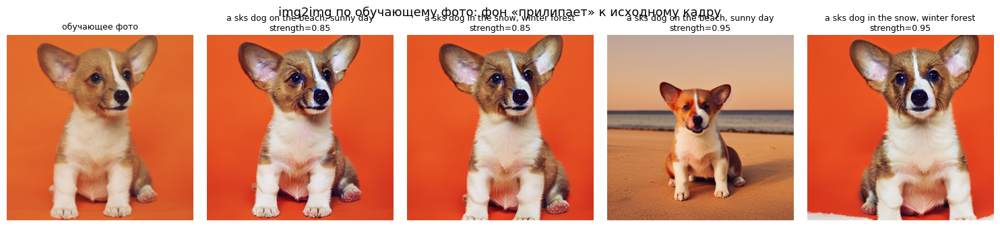

In [18]:
photo = instance_images[2].resize((RESOLUTION, RESOLUTION))
limit_prompts = [f'a {UNIQUE_TOKEN} {CLASS_TOKEN} on the beach, sunny day', f'a {UNIQUE_TOKEN} {CLASS_TOKEN} in the snow, winter forest']
rows = [photo] + edit(photo, limit_prompts, 0.85) + edit(photo, limit_prompts, 0.95)
show_images(rows, ['обучающее фото'] + [f'{short(p)}\nstrength={s}' for s in (0.85, 0.95) for p in limit_prompts],
            ncols=5, size=3, suptitle='img2img по обучающему фото: фон «прилипает» к исходному кадру')

### 6.4 Количественная оценка: CLIP-метрики

Метрики из статьи DreamBooth:
- **CLIP-I** — средняя косинусная близость CLIP-эмбеддингов сгенерированных изображений и реальных фото концепта (насколько сохраняется *идентичность* объекта);
- **CLIP-T** — косинусная близость эмбеддинга изображения и текста промпта (насколько выполняется *текстовая инструкция*). Для CLIP-T токен `sks` заменяем на `corgi puppy`, т.к. CLIP не знает, что такое `sks`.

Используем CLIP ViT-L/14.

In [19]:
del img2img
clip = CLIPModel.from_pretrained('openai/clip-vit-large-patch14', torch_dtype=torch.float16).to(device).eval()
clip_proc = CLIPProcessor.from_pretrained('openai/clip-vit-large-patch14')

@torch.no_grad()
def img_emb(images):
    x = clip_proc(images=images, return_tensors='pt')['pixel_values'].to(device, torch.float16)
    return F.normalize(clip.get_image_features(pixel_values=x).float(), dim=-1)

@torch.no_grad()
def txt_emb(texts):
    x = clip_proc(text=texts, return_tensors='pt', padding=True).to(device)
    return F.normalize(clip.get_text_features(**x).float(), dim=-1)

ref = img_emb(instance_images)
texts = [p.replace(f'{UNIQUE_TOKEN} {CLASS_TOKEN}', 'corgi puppy') for p, _ in jobs]
t_emb = txt_emb(texts)

def clip_scores(images):
    e = img_emb(images)
    return (e @ ref.T).mean().item(), (e * t_emb).sum(-1).mean().item()

real_i = ((ref @ ref.T).sum() - len(ref)) / (len(ref) * (len(ref) - 1))
rows = [('реальные фото (между собой)', real_i.item(), float('nan')),
        ('базовая SD 1.5', *clip_scores(base_images)),
        ('DreamBooth LoRA', *clip_scores(ft_images))]
print(f'{"":30s} {"CLIP-I ↑":>10s} {"CLIP-T ↑":>10s}')
for name, ci, ct in rows:
    print(f'{name:30s} {ci:10.3f} {ct:10.3f}')

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


                                 CLIP-I ↑   CLIP-T ↑
реальные фото (между собой)         0.940        nan
базовая SD 1.5                      0.670      0.233
DreamBooth LoRA                     0.809      0.311


## 7. Выводы

**Pipeline.** Stable Diffusion работает в латентном пространстве VAE (64×64×4 вместо 512×512×3). UNet итеративно предсказывает шум, текст подмешивается через cross-attention, а classifier-free guidance усиливает влияние промпта. Ручной цикл денойзинга показывает coarse-to-fine характер генерации: к 5-му шагу из 30 уже определена композиция, дальше уточняются форма, детали и текстура.

**Дообучение.** DreamBooth с LoRA-адаптерами (rank 32, 13.6M обучаемых параметров — 1.6% UNet, файл адаптера 52 МБ) за 1000 шагов (~5.5 мин и ~6 ГБ видеопамяти на RTX 3090) привязал редкий токен `sks` к конкретному щенку корги dog6 по 5 фотографиям.

| | CLIP-I ↑ (сходство с концептом) | CLIP-T ↑ (соответствие тексту) |
|---|---|---|
| базовая SD 1.5 | 0.670 | 0.233 |
| DreamBooth LoRA | **0.809** | **0.311** |
| реальные фото между собой | 0.940 | — |

- Базовая модель на `sks dog` рисует произвольных собак, а дообученная — узнаваемого щенка dog6: рыже-белый окрас, огромные уши, белая полоса на морде, белая грудь и лапы.
- Концепт переносится в **новые контексты**, которых не было в обучающих данных: джунгли, снег, пляж, Эйфелева башня, надувной круг на воде, шапка Санты, солнечные очки, мантия волшебника, стиль Ван Гога, космос. Рост CLIP-T объясняется тем, что в CLIP-T промпт содержит «corgi puppy»: базовая модель рисует не того пса, а дообученная попадает и в объект, и в контекст.
- Благодаря **prior preservation loss** запросы без `sks` («a photo of a dog ...») дают практически те же разнообразные породы, что и базовая модель на тех же seed'ах. Language drift не наблюдается, и prior loss в течение всего обучения не растёт.
- Тот же адаптер позволяет **менять изображение по тексту** (img2img): у сгенерированного изображения щенка меняются фон, стиль и аксессуары при сохранении внешности и позы. Правки при этом умеренные: `strength` задаёт компромисс между силой изменения и сохранением исходной композиции.

**Ограничения и наблюдения.**
- Все 5 фото сняты в одной позе (сидя, анфас), и модель заметно тяготеет к этой позе. Сложные «костюмные» промпты (chef outfit, astronaut) выполняются лишь частично: вместо костюма появляется фартук или шлем, а из «sunglasses, sitting in a red sports car» остаются только очки. Иногда в кадре появляется вторая собака (Eiffel Tower, seed 0).
- Img2img по самим обучающим фото работает плохо: однотонный студийный фон «прилипает» к кадру.
- Баланс идентичность ↔ следование тексту очень чувствителен к learning rate. В пробном запуске с lr=3e-4 и 1200 шагами модель переобучилась: почти каждая генерация повторяла обучающий кадр (та же поза, оранжевый фон), стилизация под Ван Гога пропадала. Значение lr=1e-4 даёт хороший компромисс. Дополнительно силу адаптера можно регулировать при инференсе (`pipe.set_adapters(['dog6'], [scale])`).